In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
from scipy import stats
from sklearn.neighbors import KernelDensity
import matplotlib.colors as mcolors
from PIL import Image, ImageDraw
import warnings
warnings.filterwarnings("ignore")

In [2]:
kill_ERANGEL=pd.read_csv('C:/Users/sun/Desktop/Univ/4_1/MediaProject/Project2/data_Kill_ERANGEL.csv')

In [3]:
kill_ERANGEL.head()

,killed_by,kill_by_type,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y,kill_distance,kill_log_distance
0,Down and Out,not_killed,HZCBIUBIUBIU,3.0,417104.3,481058.3,ERANGEL,2U4GBNA0YmkAtDV8BIUtsazckNPT4YjBr8TFfiPl9ZSsCr...,622,RealCoconutjuice,19.0,413859.3,484157.8,4487.418551,3.652093
1,M416,weapon,RunFastKneeGrow,19.0,569463.8,381541.6,ERANGEL,2U4GBNA0YmkAtDV8BIUtsazckNPT4YjBr8TFfiPl9ZSsCr...,136,colonelcrunker,25.0,569128.9,381294.2,416.370952,2.620522
2,M16A4,weapon,Daniellalala,3.0,422891.6,484844.6,ERANGEL,2U4GBNA0YmkAtDV8BIUtsazckNPT4YjBr8TFfiPl9ZSsCr...,785,Le-Passer,17.0,422423.9,483145.9,1761.909470,3.246230
3,UMP9,weapon,orangecsl,18.0,583931.7,480778.6,ERANGEL,2U4GBNA0YmkAtDV8BIUtsazckNPT4YjBr8TFfiPl9ZSsCr...,436,Jamarkus,16.0,585560.0,483584.9,3244.484640,3.511280
4,M416,weapon,niuhongfei1,6.0,271145.1,562685.8,ERANGEL,2U4GBNA0YmkAtDV8BIUtsazckNPT4YjBr8TFfiPl9ZSsCr...,1511,Blind_LeeSin,7.0,270507.0,562770.3,643.670615,2.809338


In [5]:
erangel_img=Image.open('C:/Users/sun/Desktop/Univ/4_1/MediaProject/Project2/erangel.jpg')

In [6]:
#지도 이미지 크기와 위치 맵핑하기 쉽게 조정하기

def adjust_coordinate(df):
     coordinate_columns = ['victim_position_x', 'victim_position_y','killer_position_x', 'killer_position_y']
     df[coordinate_columns] = df[coordinate_columns] / 800000 * 4096
     return df

In [7]:
ERANGEL_adj=adjust_coordinate(kill_ERANGEL)

In [8]:
ERANGEL_adj

,killed_by,kill_by_type,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y,kill_distance,kill_log_distance
0,Down and Out,not_killed,HZCBIUBIUBIU,3.0,2135.574016,2463.018496,ERANGEL,2U4GBNA0YmkAtDV8BIUtsazckNPT4YjBr8TFfiPl9ZSsCr...,622,RealCoconutjuice,19.0,2118.959616,2478.887936,4487.418551,3.652093
1,M416,weapon,RunFastKneeGrow,19.0,2915.654656,1953.492992,ERANGEL,2U4GBNA0YmkAtDV8BIUtsazckNPT4YjBr8TFfiPl9ZSsCr...,136,colonelcrunker,25.0,2913.939968,1952.226304,416.370952,2.620522
2,M16A4,weapon,Daniellalala,3.0,2165.204992,2482.404352,ERANGEL,2U4GBNA0YmkAtDV8BIUtsazckNPT4YjBr8TFfiPl9ZSsCr...,785,Le-Passer,17.0,2162.810368,2473.707008,1761.909470,3.246230
3,UMP9,weapon,orangecsl,18.0,2989.730304,2461.586432,ERANGEL,2U4GBNA0YmkAtDV8BIUtsazckNPT4YjBr8TFfiPl9ZSsCr...,436,Jamarkus,16.0,2998.067200,2475.954688,3244.484640,3.511280
4,M416,weapon,niuhongfei1,6.0,1388.262912,2880.951296,ERANGEL,2U4GBNA0YmkAtDV8BIUtsazckNPT4YjBr8TFfiPl9ZSsCr...,1511,Blind_LeeSin,7.0,1384.995840,2881.383936,643.670615,2.809338
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8968570,AKM,weapon,Schrade03,7.0,2040.677888,1493.502464,ERANGEL,2U4GBNA0YmleHpFnzELtYdsnrlIW6s85JKQ9k61Z27ai-K...,284,Mc_Popeyes,34.0,2041.336832,1493.233152,139.033989,2.146233
8968571,M16A4,weapon,ManzAreFried,2.0,1711.199232,862.724096,ERANGEL,2U4GBNA0YmleHpFnzELtYdsnrlIW6s85JKQ9k61Z27ai-K...,281,ColiN_143,35.0,1718.502400,808.992256,10590.993684,4.024978
8968572,AKM,weapon,Mint_Pudding,18.0,1972.459520,594.134528,ERANGEL,2U4GBNA0YmleHpFnzELtYdsnrlIW6s85JKQ9k61Z27ai-K...,219,ID-Fuck,39.0,1956.817920,586.938368,3362.804670,3.526831
8968573,AKM,weapon,conemeli,8.0,814.253568,1416.615936,ERANGEL,2U4GBNA0YmleHpFnzELtYdsnrlIW6s85JKQ9k61Z27ai-K...,221,ChinaJiefangjun_,41.0,816.026624,1407.383040,1836.250141,3.264168


In [11]:
#컬러맵 만들기
reds_color = np.zeros((100, 4))
reds_color[:, 0] = np.linspace(0, 1, 100)
reds_color[:, 3] = np.linspace(0.4, 1, 100)
reds_color[:10] = 0
alpha_reds_cmap = mcolors.LinearSegmentedColormap.from_list('alpha_reds', colors=reds_color, N=1024, gamma=1)

greens_color = np.zeros((100, 4))
greens_color[:, 1] = np.linspace(0, 1, 100)
greens_color[:, 3] = np.linspace(0.4, 1, 100)
greens_color[:10] = 0
alpha_greens_cmap = mcolors.LinearSegmentedColormap.from_list('alpha_greens', colors=greens_color, N=1024, gamma=1)

In [12]:
#히트맵 그리기

def draw_heatmap(df,img,bw,cmap):
    x_mesh = np.linspace(0, 4096, 100)
    y_mesh = np.linspace(0, 4096, 100)
    X, Y = np.meshgrid(x_mesh, y_mesh)
    xy = np.vstack([X.ravel(), Y.ravel()]).T

    kde = KernelDensity(kernel='epanechnikov', bandwidth=bw).fit(df.to_numpy())
    log_density = kde.score_samples(xy)
    log_density = log_density.reshape((100, 100))
    density = np.exp(log_density)
    
    fig, ax = plt.subplots(figsize=(16, 16))

    plt.gca().invert_yaxis()
    ax.contourf(X, Y, density, alpha=None, cmap=cmap)
    ax.imshow(img, aspect='auto', extent=[0,4096,4096,0])
    return fig, ax

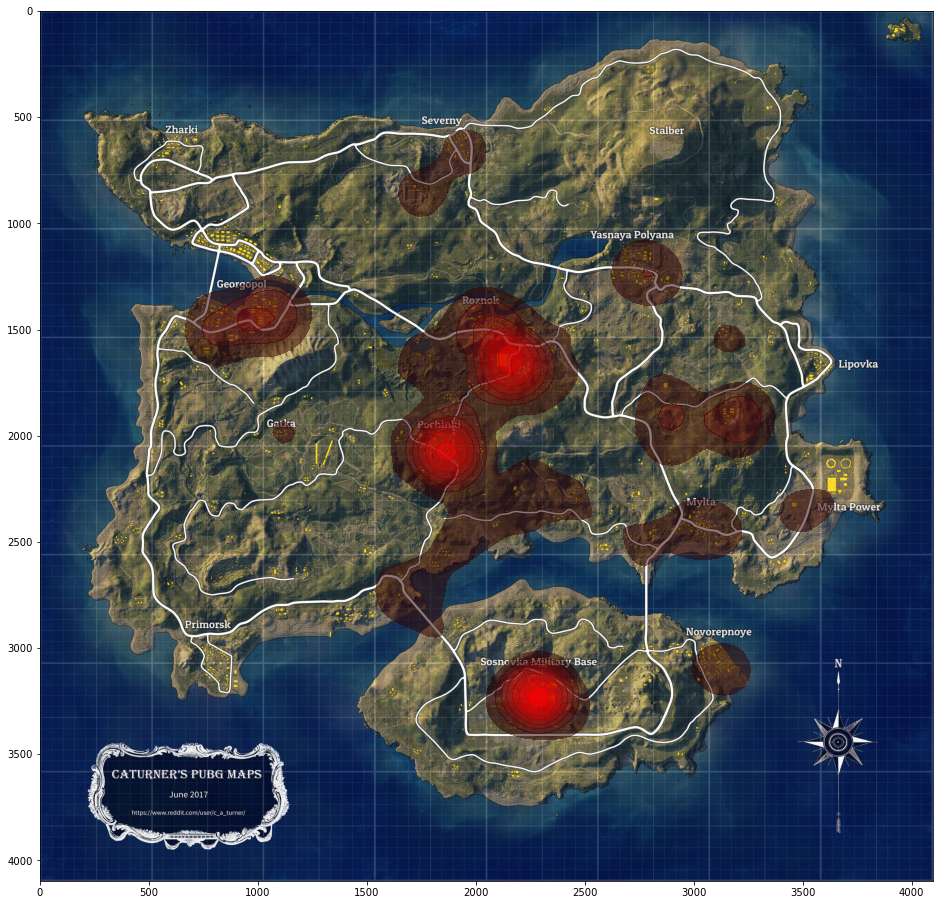

In [23]:
#에란겔 맵에서 죽은 유저들의 위치 분포 확인
ax=draw_heatmap(ERANGEL_adj[['victim_position_x','victim_position_y']],erangel_img,200, alpha_reds_cmap)

In [24]:
ax[0].savefig('erangel_total_victim_position.jpg')

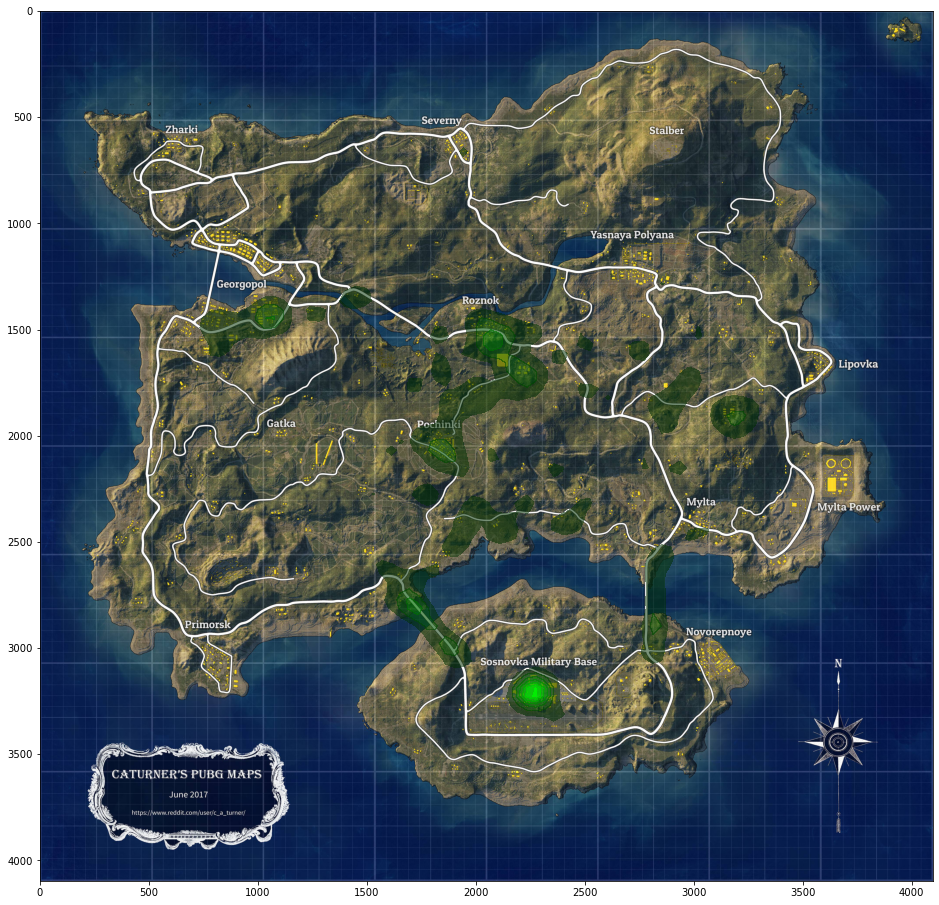

In [25]:
#에란겔 맵에서 킬 거리 상위 20퍼센트 킬러들의 킬 위치 분포

longdistance_ERANGEL=ERANGEL_adj[ERANGEL_adj['kill_distance']>ERANGEL_adj['kill_distance'].quantile(0.8)]

ax=draw_heatmap(longdistance_ERANGEL[['killer_position_x','killer_position_y']],erangel_img,80, alpha_greens_cmap)

In [26]:
ax[0].savefig('erangel_long_killer.jpg')

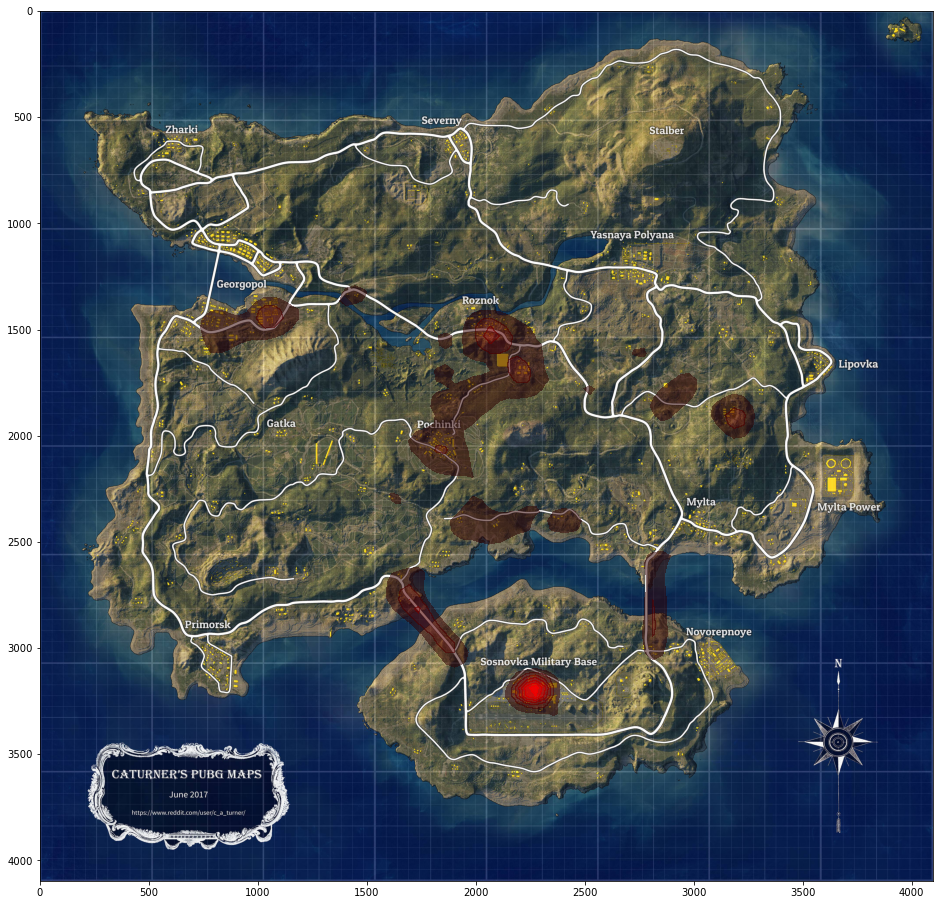

In [27]:
#에란겔 맵에서 킬 거리 상위 20퍼센트 킬러들에 의해 죽은유저들의 위치 분포

ax=draw_heatmap(longdistance_ERANGEL[['victim_position_x','victim_position_y']],erangel_img,80, alpha_reds_cmap)

In [28]:
ax[0].savefig('erangel_long_victim.jpg')

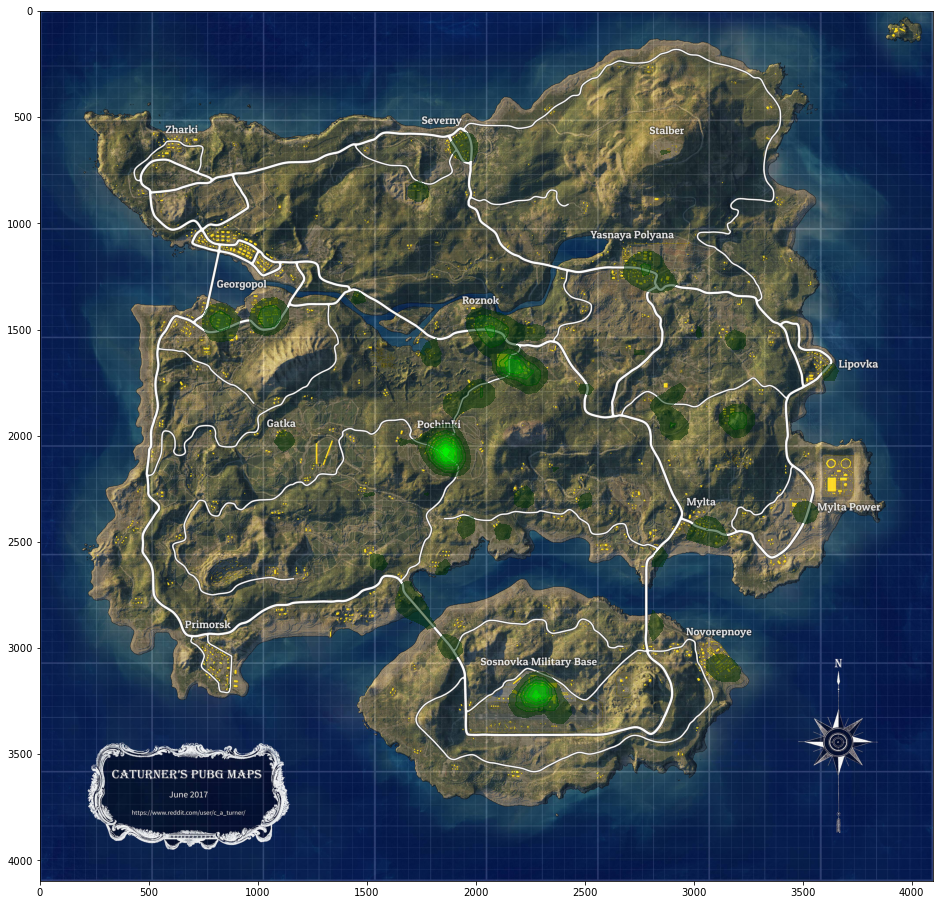

In [33]:
#에란겔 맵에서 등수 10등 이내의 킬러들의 킬 위치 분포

top_killer_ERANGEL=ERANGEL_adj[ERANGEL_adj['killer_placement']<=10]

ax=draw_heatmap(top_killer_ERANGEL[['killer_position_x','killer_position_y']],erangel_img,80,alpha_greens_cmap)

In [34]:
ax[0].savefig('erangel_top_killer.jpg')